##### First, we will load the modules and inference data and define some settings

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import analysis_utils
from copy import deepcopy

from sklearn.linear_model import Ridge, LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'k2369_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

##### Duplicate mutants which we excluded

In [2]:
db_ = pd.read_csv(os.path.join(path, 'data', 'external_datasets', 'Id25c03_1merNCLB.txt'), sep=' ', header=None)
db_['idx'] = db_[0] + '_' + db_[1]
db_.loc[db_['idx'].duplicated(keep='last')]

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,idx
2011,2K7J,AA29E,0.41,10,0,0,1,NMRl,0.0,1,...,AEHTQAEGK,5.5,28.0,0.4,40.7,91095,10884358,Urea,Acylphophatase-1,2K7J_AA29E
2012,2K7J,GA31A,1.74,10,0,0,1,NMRl,0.0,1,...,GAQAEGKKL,5.5,28.0,0.02,1.9,91096,10884358,Urea,Acylphophatase-1,2K7J_GA31A


### Supplementary Figure 2: Mutant Amino Acid Distributions for K2369 and Q3421

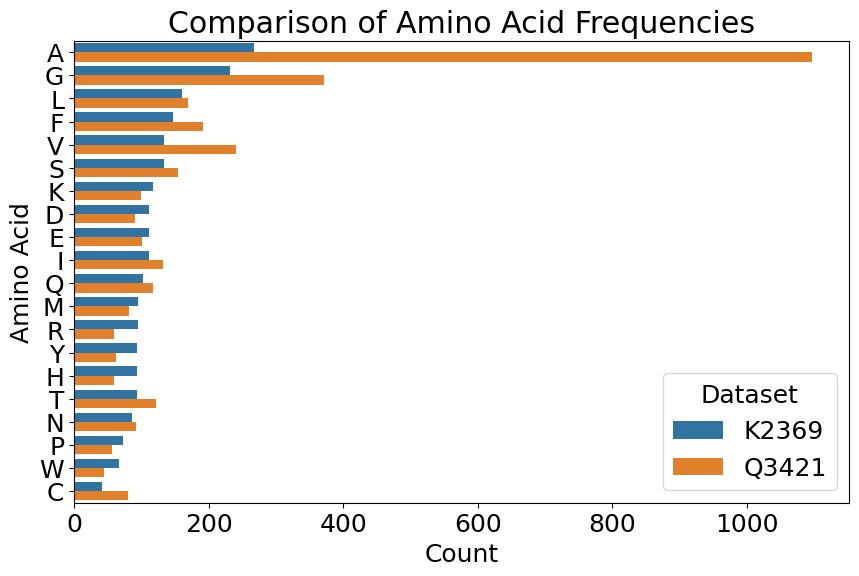

In [3]:
db2 = pd.read_csv(preds_loc.replace('k2369', 'q3421')).set_index(['uid', 'uid2'])
fig = analysis_utils.plot_joint_histogram(db, db2, 'mutation')
#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'supp_fig2.svg'), bbox_inches='tight')

##### Perform preprocessing

In [4]:
db_class = db
print('Original unique mutations:', len(db_class))

# number of interface mutations (7 Angstrom cross-chain cutoff)
print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

# define categories
evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh', 'saprot']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro', 'q3421']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

# determine which columns contain predictions
original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
#print(original_pred_cols)

# separate runtimes into another dataframe
db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

# remove individual predictions from models designed to be ensembled
original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
#print(original_pred_cols_reduced)

# reduce the working dataframe to only the columns of interest
db_class = db_class[original_pred_cols + ['ddG', 'cluster']]

# define extra columns (ensemble and baselines)
db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=db['ddG'].mean(), size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']
db_class['upper_bound_dir'] = db_class['ddG'] + np.random.normal(loc=0, size=len(db_class))

db_class

Original unique mutations: 2369
Detected 40 interface mutations


,,esmif_multimer_dir,esm2_3B_dir,esm2_15B_half_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,mif_dir,mifst_dir,esm2_150M_dir,esm2_650M_dir,...,msa_transformer_median_dir,msa_transformer_mean_dir,stability-oracle_dir,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir,upper_bound_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,0.000611,-13.121611,-10.045898,-0.868792,-1.349262,0.501946,-7.472339,-11.654044,-10.383169,-10.866617,...,-10.673284,-10.676060,-0.492,-10.880333,-0.36,1,-12.229596,-0.626737,-0.36,-1.663095
1A23_30S,1A23_30S,-0.043712,-11.571676,-11.668701,1.966927,1.883221,-0.990958,1.864485,-6.805952,-9.410211,-8.321783,...,-8.871069,-8.594967,-0.416,-1.567467,-1.80,2,0.315755,-1.076670,-1.80,-2.489711
1A23_33S,1A23_33S,-0.024960,-12.002896,-12.722168,1.284340,-0.590150,0.144643,0.348253,-5.093968,-7.901006,-8.226297,...,-7.518724,-7.353611,-0.409,0.794333,-1.10,2,0.204184,1.012798,-1.10,-0.844859
1A23_32L,1A23_32L,-0.042389,-13.755667,-13.076172,-0.284132,2.127287,-0.263297,1.119251,-7.800102,-10.590076,-6.658664,...,-7.715471,-7.994566,-0.017,1.773667,-4.60,2,3.900953,-0.823116,-4.60,-4.011568
1A23_32S,1A23_32S,-0.029983,-8.291791,-10.436035,0.308985,0.916851,0.773268,-0.854073,-5.414868,-5.397206,-3.793028,...,-5.910285,-4.737221,-0.415,-2.198333,-5.20,2,-1.281482,0.274914,-5.20,-6.322685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2RPN_21K,2RPN_21K,0.027008,-0.922159,1.738525,1.976867,2.105576,2.021208,3.257286,3.271853,3.515588,2.811706,...,-6.245655,-6.258409,-0.013,-1.762667,0.39,66,0.342910,0.399027,0.39,0.816557
1NFI_203L,1NFI_134L,-0.015014,-0.272333,1.275391,-2.453734,-3.669720,-2.377865,0.287117,-6.147088,0.095409,0.499470,...,-0.856210,-0.356228,-0.653,-6.325333,0.80,3,-9.995053,-0.348837,0.80,0.970474
1VII_64A,1VII_24A,0.030383,-11.894410,-12.566406,1.503718,2.008697,1.893616,1.031978,-10.141825,-9.803039,-11.242952,...,-10.325906,-10.967064,-0.087,-3.867000,-0.97,63,-1.858303,-1.240374,-0.97,-0.418728


### Supplementary Figure 8

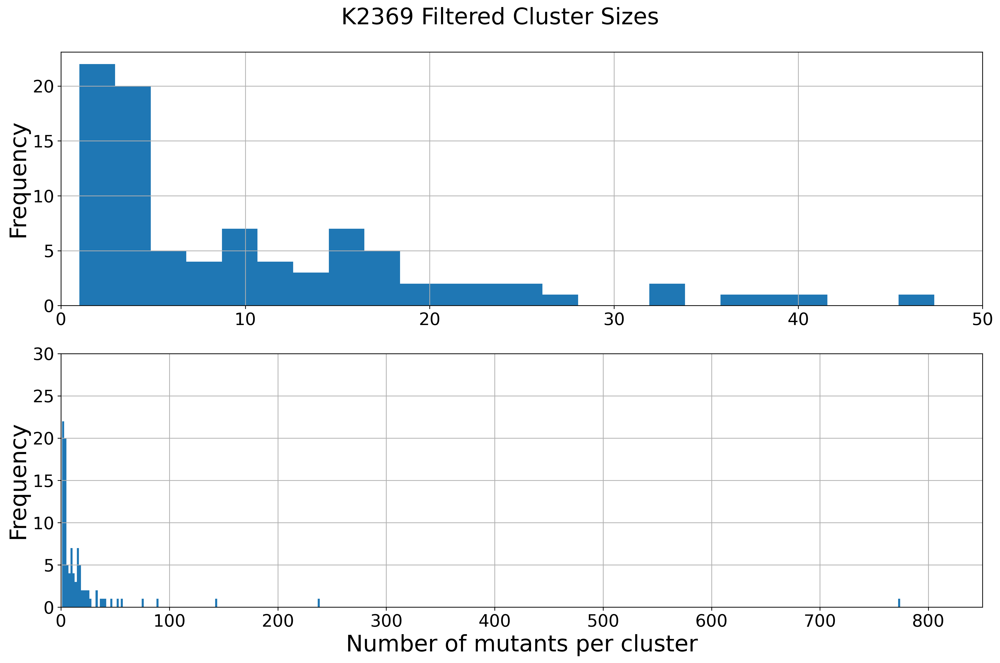

In [5]:
fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50])  # Set x-axis limits for the first plot
axes[0].tick_params(axis='x', labelsize=18)  # Set x-tick label size for the first plot
axes[0].set_ylabel('Frequency', fontsize=24)  # Set y-label for the first plot

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 850]) 
axes[1].set_ylim([0, 30])  # Set x-axis limits for the first plot
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('K2369 Filtered Cluster Sizes', fontsize=24)
plt.tight_layout()

#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'supp_fig8.svg'), bbox_inches='tight')

In [6]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

7 92


### Recursive Feature Addition - Getting the Ensemble Predictions for the Other Datasets

Using 1566 training observations with less than 25\% sequence identity to Ssym or S461
delta_vol_dir
delta_kdh_dir
rel_ASA_dir
mifst_dir
mpnn_20_00_dir
esmif_multimer_dir
ankh_dir
msa_transformer_mean_dir


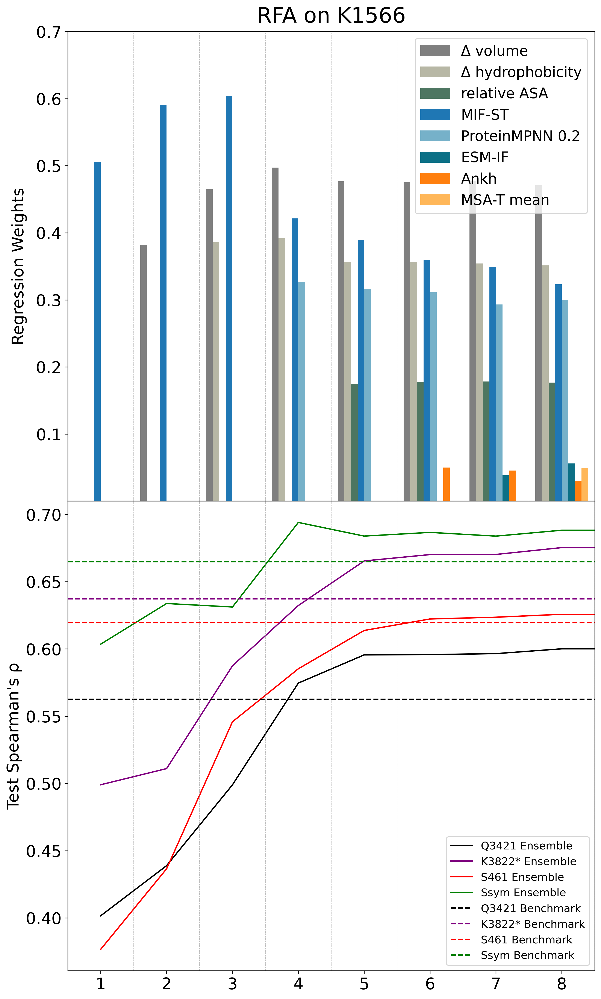

In [7]:
# which features are allowed to be used
cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_weights_dir'] #'mutcomputex_dir',

# fill missing values with 0
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]#.loc[~df_train['overlaps_seq_k3822star']]
print('Using', len(df_train), 'training observations with less than 25\% sequence identity to Ssym or S461')

# load and preprocess other datasets for testing the ensembles on
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)

df_test_q3421 = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')).set_index('uid')
df_test_q3421 = df_test_q3421[[c for c in df_test_q3421.columns if not 'K1566_pslm' in c]]
df_test_q3421.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_q3421.columns]

df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'K1566_pslm' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]

df_test_k3822star = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k3822_analysis.csv')).set_index(['uid', 'uid2'])
df_test_k3822star = df_test_k3822star[[c for c in df_test_k3822star.columns if not 'K1566_pslm' in c]]
df_test_k3822star.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_k3822star.columns]
df_test_k3822star = df_test_k3822star.drop(df_train.index)

df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'K1566_pslm' in c]]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test_q3421, 'K3822*': df_test_k3822star, 's461': df_test_s461, 'ssym': df_test_ssym, 'test': df_test} #

# actaully perform the RFA
test_scores, weights_df, dfs_test, _ = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='K1566_pslm')

# add the predictions to the other analysis tables
db_class = db_class[[c for c in db_class.columns if not 'K1566_pslm' in c]]
db_class = db_class.join(df_test[[c for c in df_test.columns if 'rfa_' in c]]).rename(dict(zip([c for c in df_test.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_q3421.columns if 'K1566_pslm' in c])), axis=1)

df_test_k3822star = dfs_test['K3822*']
df_test_k3822star = df_test_k3822star.rename(dict(zip([c for c in df_test_k3822star.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_k3822star.columns if 'K1566_pslm' in c])), axis=1)

df_test_q3421 = dfs_test['q3421']
df_test_q3421 = df_test_q3421.rename(dict(zip([c for c in df_test_q3421.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_q3421.columns if 'K1566_pslm' in c])), axis=1)
#df_test_q3421.to_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv'))

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_s461.columns if 'K1566_pslm' in c])), axis=1)
#df_test_s461.to_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
#df_test_ssym.to_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))

# this figure represents Fig 4 if the test datasets were not bootstrapped

### Figure 4 - reduced bootstrapping

Using 1566 training observations with less than 25\% sequence identity to Ssym or S461
q3421
K3822*
s461
ssym
delta_vol_dir
delta_kdh_dir
rel_ASA_dir
mifst_dir
mpnn_20_00_dir
esmif_multimer_dir
ankh_dir
msa_transformer_mean_dir


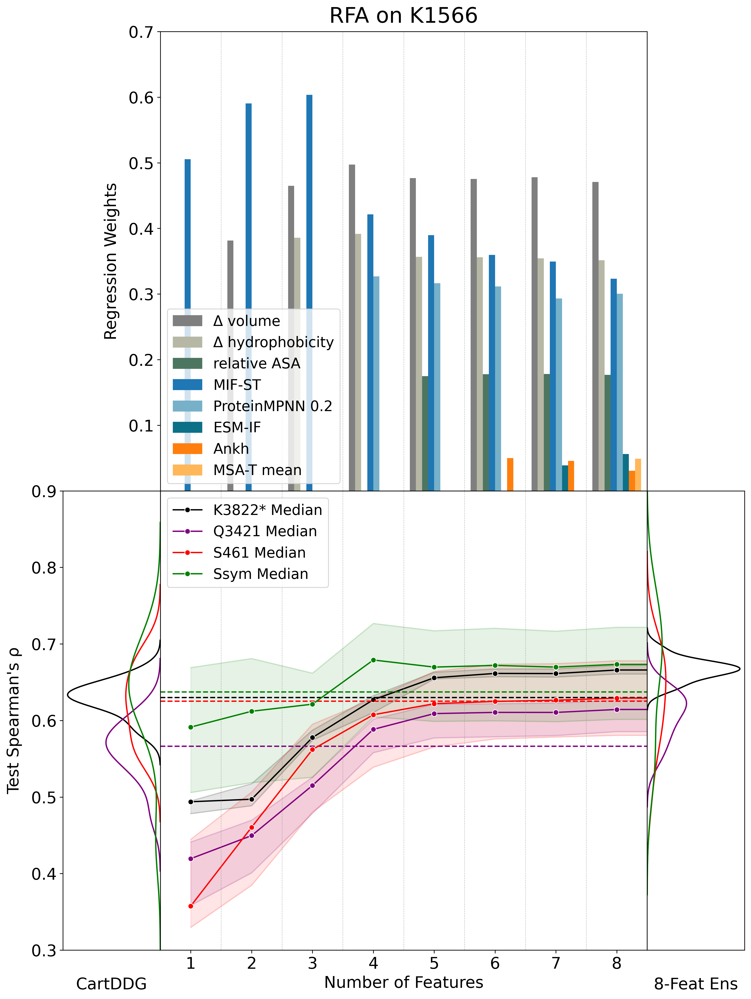

In [8]:
n_bootstraps = 10

# which features are allowed to be used
cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_weights_dir'] #'mutcomputex_dir',

# fill missing values with 0
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]#.loc[~df_train['overlaps_seq_k3822star']]
print('Using', len(df_train), 'training observations with less than 25\% sequence identity to Ssym or S461')

# load and preprocess other datasets for testing the ensembles on
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)

df_test_q3421 = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')).set_index('uid')
df_test_q3421 = df_test_q3421[[c for c in df_test_q3421.columns if not 'K1566_pslm' in c]]
df_test_q3421.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_q3421.columns]
dfs_test_q3421 = analysis_utils.bootstrap_by_grouper(df_test_q3421, n_bootstraps, grouper='cluster', drop=True, noise=0, target='ddG', duplicates=True)

df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'K1566_pslm' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]
dfs_test_s461 = analysis_utils.bootstrap_by_grouper(df_test_s461, n_bootstraps, grouper='cluster', drop=True, noise=0, target='ddG', duplicates=True)

df_test_k3822star = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k3822_analysis.csv')).set_index(['uid', 'uid2'])
df_test_k3822star = df_test_k3822star[[c for c in df_test_k3822star.columns if not 'K1566_pslm' in c]]
df_test_k3822star.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_k3822star.columns]
df_test_k3822star = df_test_k3822star.drop(df_train.index)
dfs_test_k3822star = analysis_utils.bootstrap_by_grouper(df_test_k3822star, n_bootstraps, grouper='cluster', drop=True, noise=0, target='ddG', duplicates=True)

df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'K1566_pslm' in c]]
df_test_ssym.columns = [c + '_dir' if c not in ['cluster', 'ddG', 'ddG_dir'] else c for c in df_test_ssym.columns]
dfs_test_ssym = analysis_utils.bootstrap_by_grouper(df_test_ssym, n_bootstraps, grouper='cluster', drop=True, noise=0, target='ddG', duplicates=True)

dfs_test = {'q3421': dfs_test_q3421, 'K3822*': dfs_test_k3822star, 's461': dfs_test_s461, 'ssym': dfs_test_ssym} #, 'K1566': [df_test] #

# actually perform the RFA
test_scores, weights_df, dfs_test, fig = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='K1566_pslm', bs=n_bootstraps)
        #saveloc_upper=os.path.join(path, 'data', 'extended', 'figure_data', 'fig4a.csv'), saveloc_lower=os.path.join(path, 'data', 'extended', 'figure_data', 'fig4b.csv'))

#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'fig4.pdf'), bbox_inches='tight')
#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'fig4.svg'), bbox_inches='tight')

### Recursive Feature Addition (All Models) (Not included in text)

Using 1566 training observations with less than 25\% sequence identity to Ssym or S461
delta_vol_dir
delta_kdh_dir
rel_ASA_dir
mifst_dir
mpnn_20_00_dir
msa_transformer_mean_dir
stability-oracle_dir
cartesian_ddg_dir


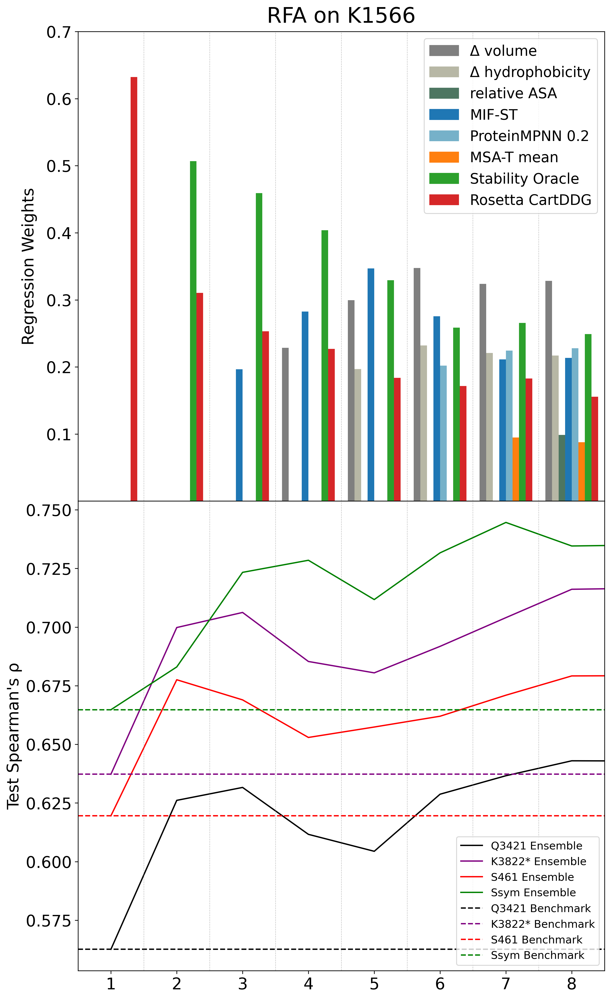

In [9]:
# Repeat the above but this time include Rosetta

cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'cartesian_ddg_dir', 'stability-oracle_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'mifst_dir', 'mif_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_weights_dir']#, 'mutcomputex_dir']
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]#.loc[~df_train['overlaps_seq_k3822star']]
print('Using', len(df_train), 'training observations with less than 25\% sequence identity to Ssym or S461')

df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)

df_test_q3421 = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')).set_index('uid')
df_test_q3421 = df_test_q3421[[c for c in df_test_q3421.columns if not 'K1566_all' in c]]
df_test_q3421.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_q3421.columns]

df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'K1566_all' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]

df_test_k3822star = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k3822_analysis.csv')).set_index(['uid', 'uid2'])
df_test_k3822star = df_test_k3822star[[c for c in df_test_k3822star.columns if not 'K1566_all' in c]]
df_test_k3822star.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_k3822star.columns]
df_test_k3822star = df_test_k3822star.drop(df_train.index)

df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'K1566_all' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test_q3421, 'K3822*': df_test_k3822star, 's461': df_test_s461, 'ssym': df_test_ssym, 'K1566': df_test} #

test_scores, weights_df, dfs_test, _ = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='K1566_all')
#        saveloc_upper=os.path.join(path, 'data', 'extended', 'figure_data', 'test_upper.csv'), saveloc_lower=os.path.join(path, 'data', 'extended', 'figure_data', 'test_lower.csv'))

db_class = db_class[[c for c in db_class.columns if not 'K1566_all' in c]]
db_class = db_class.join(df_test[[c for c in df_test.columns if 'rfa_' in c]]).rename(dict(zip([c for c in df_test.columns if 'K1566_all' in c], [c+'_dir' for c in df_test_q3421.columns if 'K1566_all' in c])), axis=1)

In [10]:
# remove most of the ensemble predictions from db_class (saves time on next steps)

drop_cols = [c for c in db_class.columns if 'K1566_all' in c]
#drop_cols += [c for c in db_class.columns if 'K1566_pslm' in c and not '5' in c]
db_class = db_class.drop(drop_cols, axis=1)
db_class

,,esmif_multimer_dir,esm2_3B_dir,esm2_15B_half_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,mif_dir,mifst_dir,esm2_150M_dir,esm2_650M_dir,...,K1566_pslm_rfa_2_dir,K1566_pslm_rfa_3_dir,K1566_pslm_rfa_4_dir,K1566_pslm_rfa_5_dir,K1566_pslm_rfa_6_dir,K1566_pslm_rfa_7_dir,K1566_pslm_rfa_8_dir,K1566_pslm_rfa_9_dir,K1566_pslm_rfa_10_dir,K1566_pslm_rfa_11_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,0.000611,-13.121611,-10.045898,-0.868792,-1.349262,0.501946,-7.472339,-11.654044,-10.383169,-10.866617,...,-0.372052,-0.642978,-0.120629,-0.336641,-0.360260,-0.303840,-0.319618,-0.319618,-0.319618,-0.381625
1A23_30S,1A23_30S,-0.043712,-11.571676,-11.668701,1.966927,1.883221,-0.990958,1.864485,-6.805952,-9.410211,-8.321783,...,-0.747276,-1.153093,-0.481144,-0.598767,-0.644650,-0.655688,-0.662076,-0.662076,-0.662076,-0.617558
1A23_33S,1A23_33S,-0.024960,-12.002896,-12.722168,1.284340,-0.590150,0.144643,0.348253,-5.093968,-7.901006,-8.226297,...,-0.508203,-0.908739,-0.652323,-0.847762,-0.886525,-0.874524,-0.883446,-0.883446,-0.883446,-0.849035
1A23_32L,1A23_32L,-0.042389,-13.755667,-13.076172,-0.284132,2.127287,-0.263297,1.119251,-7.800102,-10.590076,-6.658664,...,-0.860405,-0.238619,0.527572,0.423921,0.443370,0.423905,0.405850,0.405850,0.405850,0.447278
1A23_32S,1A23_32S,-0.029983,-8.291791,-10.436035,0.308985,0.916851,0.773268,-0.854073,-5.414868,-5.397206,-3.793028,...,-0.890157,-0.797934,-0.339489,-0.394402,-0.342602,-0.356374,-0.353200,-0.353200,-0.353200,-0.338479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2RPN_21K,2RPN_21K,0.027008,-0.922159,1.738525,1.976867,2.105576,2.021208,3.257286,3.271853,3.515588,2.811706,...,1.053140,0.286426,0.580764,0.670827,0.695854,0.688453,0.617150,0.617150,0.617150,0.614567
1NFI_203L,1NFI_134L,-0.015014,-0.272333,1.275391,-2.453734,-3.669720,-2.377865,0.287117,-6.147088,0.095409,0.499470,...,-0.378599,-0.433441,-0.529294,-0.637093,-0.546427,-0.512533,-0.478431,-0.478431,-0.478431,-0.383616
1VII_64A,1VII_24A,0.030383,-11.894410,-12.566406,1.503718,2.008697,1.893616,1.031978,-10.141825,-9.803039,-11.242952,...,-2.158026,-2.183060,-1.421066,-1.151588,-1.238494,-1.206809,-1.171316,-1.171316,-1.171316,-1.175461


### Non-bootstrapped Analysis of K2369 (not in text)

In [11]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 
                                           'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 
                                           'recall@k1.0', 'aumsc', 'auppc', 'PPV'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
#summ.to_csv('../data/extended/k2369_extended.csv')
tmp_ = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp_.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'PPV', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF mean', 'Clustered Ensemble', 'Ensemble 4 Feats', 'Ensemble 5 Feats', 'Ensemble 6 Feats', 'Ensemble 7 Feats', 'Ensemble 8 Feats',
    'ProteinMPNN 0.2', 'MIF-ST', 'KORPM',  'MSA-T mean', 'MSA-T 1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 'ESM-1V 2', 
    'Gaussian Noise', 'ΔΔG label', 'ΔTm label', 'Rosetta/ProtMPNN', 'Stability Oracle', 'MutComputeX', 'Theoretical Max'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# ~ 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  wNDCG  \
measurement model_type  model                                                  
ΔΔG         unknown     ΔΔG label         2369.0  1.000  1.000  1.000  1.000   
                        Theoretical Max   2369.0  0.543  0.820  0.779  0.838   
            struc. PSLM Rosetta/ProtMPNN  2369.0  0.349  0.748  0.643  0.754   
            ensemble    Ensemble 4 Feats  2369.0  0.419  0.727  0.645  0.749   
            transfer    Stability Oracle  2357.0  0.386  0.728  0.615  0.756   
            ensemble    Ensemble 5 Feats  2369.0  0.445  0.725  0.656  0.742   
                        Ensemble 8 Feats  2369.0  0.443  0.731  0.660  0.744   
                        Ensemble 6 Feats  2369.0  0.440  0.725  0.657  0.745   
                        Ensemble 7 Feats  2369.0  0.437  0.723  0.656  0.744   
            biophysical Rosetta CartDDG   2369.0  0.371  0.706  0.620  0.740   
            struc. PSLM ProteinMPNN 0.3   2369.0  0.266  0.635  0.443  0.743   
                        ProteinMPNN 0.2   2369.0  0.287  0.648  0.449  0.733   
                        MIF               2369.0  0.240  0.622  0.442  0.699   
            potential   KORPM             2369.0  0.382  0.676  0.552  0.734   
            struc. PSLM ESM-IF            2369.0  0.244  0.615  0.354  0.714   
                        MIF-ST            2369.0  0.223  0.627  0.447  0.712   
            seq. PSLM   ESM-2 650M        2369.0  0.183  0.554  0.288  0.687   
                        ESM-2 3B          2369.0  0.147  0.548  0.303  0.669   
                        ESM-2 15B         2369.0  0.172  0.573  0.350  0.656   
                        ESM-2 150M        2369.0  0.156  0.525  0.196  0.673   
                        ESM-1V mean       2369.0  0.161  0.538  0.220  0.667   
                        MSA-T 1           2369.0  0.176  0.588  0.355  0.655   
                        Tranception       2369.0  0.125  0.535  0.324  0.663   
                        Ankh              2369.0  0.196  0.577  0.347  0.666   
                        MSA-T mean        2369.0  0.173  0.595  0.367  0.665   
                        ESM-1V 2          2369.0  0.168  0.533  0.211  0.649   
            unknown     Gaussian Noise    2369.0  0.002  0.426  0.004  0.593   

                                          wAUPRC     wρ  mean_t1s  \
measurement model_type  model                                       
ΔΔG         unknown     ΔΔG label          0.920  1.000     0.906   
                        Theoretical Max    0.745  0.686     0.475   
            struc. PSLM Rosetta/ProtMPNN   0.739  0.539     0.162   
            ensemble    Ensemble 4 Feats   0.696  0.509     0.149   
            transfer    Stability Oracle   0.689  0.503     0.084   
            ensemble    Ensemble 5 Feats   0.691  0.502     0.158   
                        Ensemble 8 Feats   0.693  0.500     0.183   
                        Ensemble 6 Feats   0.689  0.496     0.185   
                        Ensemble 7 Feats   0.685  0.495     0.172   
            biophysical Rosetta CartDDG    0.695  0.475     0.090   
            struc. PSLM ProteinMPNN 0.3    0.668  0.452     0.097   
                        ProteinMPNN 0.2    0.687  0.450     0.099   
                        MIF                0.658  0.446    -0.013   
            potential   KORPM              0.671  0.445     0.020   
            struc. PSLM ESM-IF             0.653  0.443     0.028   
                        MIF-ST             0.643  0.389    -0.059   
            seq. PSLM   ESM-2 650M         0.613  0.316    -0.096   
                        ESM-2 3B           0.613  0.296    -0.087   
                        ESM-2 15B          0.602  0.280    -0.152   
                        ESM-2 150M         0.595  0.279    -0.252   
                        ESM-1V mean        0.598  0.272    -0.290   
                        MSA-T 1            0.592  0.267    -0.205   
                        Tranception        0.593  0.259    -0.217   
 

### Bootstrapped KORPM Analysis (Used for Figure 1b and Extended Data Table 2), reduced bootstrapping

In [12]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'auprc', 'spearman', 'net_stabilization', 'sensitivity', 'recall@k1.0', 'MCC'),  
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=10, quiet=True)
tmp1 = summ.reset_index()
#tmp1.to_csv('../data/extended/k2369_extended_bootstrapped.csv')
s2 = tmp1.sort_values('auprc_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'upper_bound_dir',
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'K1566_pslm_rfa_8_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)

# ~ 2 minutes for 10 bootstraps

upper_bound
mpnn_rosetta
stability-oracle
cartesian_ddg
korpm
mpnn_20_00
esm2_650M
random


AUPRC Spearman's ρ Net Stabilization    MCC  \
Model Type  Model                                                               
unknown     ΔΔG label              1.00         1.00         588 ± 221   1.00   
            Theoretical Max        0.81         0.79         358 ± 139   0.55   
struc. PSLM Rosetta/ProtMPNN       0.75         0.65        202 ± 56.2   0.40   
transfer    Stability Oracle       0.72         0.61        179 ± 87.3   0.41   
ensemble    Ensemble 4 Feats       0.71         0.64         196 ± 128   0.42   
            Ensemble 8 Feats       0.70         0.65         199 ± 133   0.43   
            Ensemble 6 Feats       0.70         0.65         202 ± 136   0.43   
            Ensemble 5 Feats       0.70         0.64         196 ± 133   0.43   
            Ensemble 7 Feats       0.70         0.65         199 ± 133   0.42   
biophysical Rosetta CartDDG        0.69         0.61        176 ± 86.2   0.39   
ensemble    Ensemble 3 Feats       0.68         0.58         193 ± 129   0.41   
potential   KORPM                  0.67         0.56        129 ± 89.7   0.41   
struc. PSLM ProteinMPNN 0.2        0.65         0.50        123 ± 52.3   0.34   
            ProteinMPNN 0.1        0.65         0.49        123 ± 48.6   0.31   
            ProteinMPNN 0.3        0.64         0.50        106 ± 52.6   0.31   
            ESM-IF                 0.63         0.44        103 ± 37.8   0.29   
            MIF                    0.62         0.49       97.8 ± 40.8   0.29   
ensemble    Ensemble 2 Feats       0.62         0.50         113 ± 110   0.32   
struc. PSLM MIF-ST                 0.60         0.44       99.1 ± 29.8   0.25   
seq. PSLM   Ankh                   0.58         0.38       71.7 ± 36.1   0.22   
            MSA-T mean             0.58         0.35       31.8 ± 21.8   0.19   
            MSA-T median           0.57         0.35       28.4 ± 24.2   0.18   
            ESM-2 650M             0.57         0.35       83.5 ± 36.7   0.24   
            ESM-2 15B              0.56         0.35       66.2 ± 32.1   0.21   
            ESM-1V mean            0.56         0.29       31.0 ± 55.4   0.22   
            ESM-1V median          0.55         0.29       16.2 ± 64.4   0.20   
            ESM-2 3B               0.55         0.33       42.7 ± 41.8   0.19   
            ESM-2 150M             0.54         0.30      -16.3 ± 89.3   0.22   
            Tranception            0.54         0.35       46.0 ± 17.4   0.16   
            Tranception (reduced)  0.53         0.34       34.8 ± 16.2   0.14   
unknown     Gaussian Noise         0.40         0.00        -400 ± 145  -0.02   
NaN         Avg. Dev.              0.04         0.05             73.4    0.05   

                                  Sensitivity Recall @ k1  
Model Type  Model                                          
unknown     ΔΔG label                    1.00        1.00  
            Theoretical Max              0.71        0.51  
struc. PSLM Rosetta/ProtMPNN             0.38        0.33  
transfer    Stability Oracle             0.44        0.32  
ensemble    Ensemble 4 Feats             0.60        0.34  
            Ensemble 8 Feats             0.60        0.29  
            Ensemble 6 Feats             0.60        0.29  
            Ensemble 5 Feats             0.61        0.30  
            Ensemble 7 Feats             0.60        0.30  
biophysical Rosetta CartDDG              0.47        0.35  
ensemble    Ensemble 3 Feats             0.57        0.31  
potential   KORPM                        0.55        0.32  
struc. PSLM ProteinMPNN 0.2              0.37        0.32  
            ProteinMPNN 0.1              0.34        0.32  
            ProteinMPNN 0.3              0.38        0.32  
            ESM-IF                       0.29        0.25  
            MIF                          0.35        0.30  
ensemble    Ensemble 2 Feats             0.48        0.27  
struc. PSLM MIF-ST                       0.25        0.26  
seq. PSLM   Ankh   

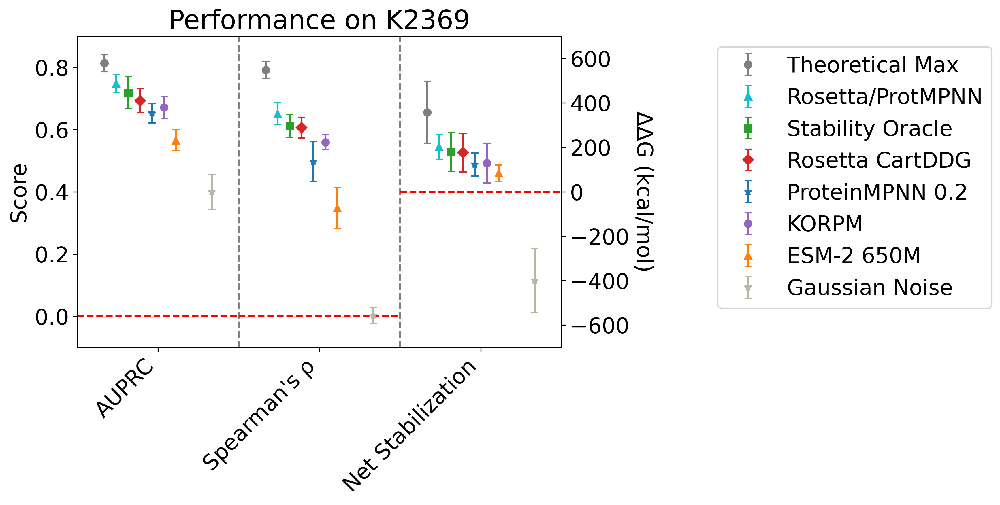

In [13]:
plot_cols = ['auprc', 'spearman','net_stabilization']
plot_models = ['upper_bound', 'mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'K2369'
y_lim = (-0.1, 0.9)
right_y_lim = (-700, 700)
table_cols = ['auprc', 'spearman','net_stabilization', 'MCC', 'sensitivity', 'recall@k1.0']
tab, fig = analysis_utils.bootstrap_table(s3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['net_stabilization'], 
                sort_col='auprc')
                #saveloc_formatted='../data/extended/k2369_bootstrapped_formatted.csv',
                #saveloc_full='../data/extended/figure_data/fig1b.csv')

#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'fig1b.svg'), bbox_inches='tight')
tab

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2b)

In [14]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))

db_class_r['upper_bound_2_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_3_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_4_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_5_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))

class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn.loc[crn['model'].str.contains('upper_bound'), 'model'] = 'upper_bound_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])

crn_out = crn[[c for c in crn.columns if '$' in c]]
crn_out = crn_out.reset_index()
crn_out['model'] = crn_out['model'].apply(lambda x: analysis_utils.remap_names_2.get(x))
crn_out = crn_out.dropna(subset='model').drop(['measurement'], axis=1)
crn_out = crn_out.set_index(['model_type', 'model'])
#crn_out.to_csv(os.path.join(path, 'data', 'extended', 'figure_data', 'fig2b.csv'), encoding='utf-8-sig')

# ~ 5 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

cartesian_ddg_dir
esm2_650M_dir
korpm_dir
upper_bound_dir
mpnn_20_00_dir
mpnn_rosetta_dir
stability-oracle_dir
random_dir
cartesian_ddg_dir
esm2_650M_dir
korpm_dir
upper_bound_dir
mpnn_20_00_dir
mpnn_rosetta_dir
stability-oracle_dir
random_dir


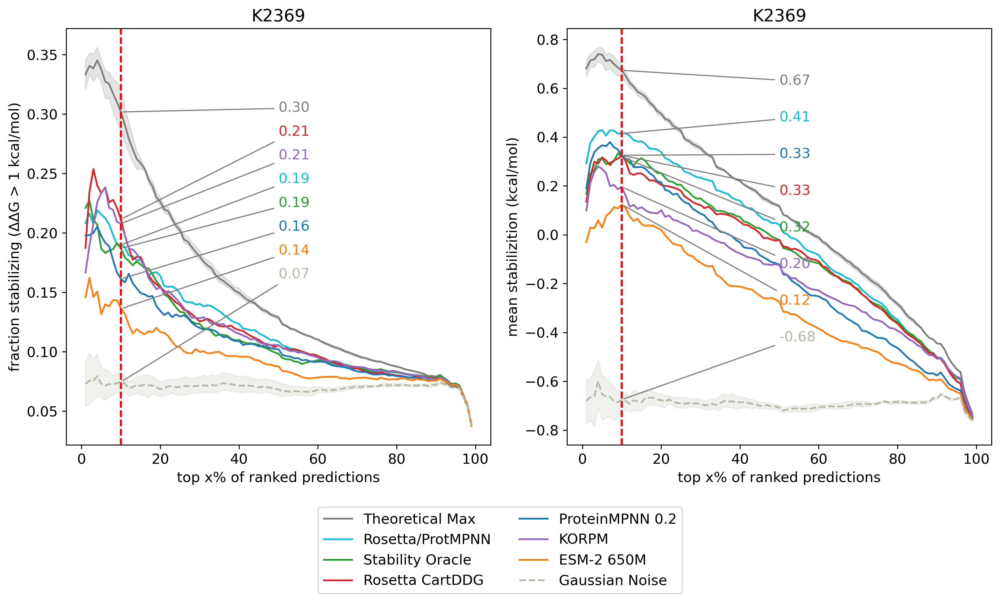

In [15]:
fig = analysis_utils.recovery_curves(crn, ['upper_bound_dir', 'mpnn_rosetta_dir', 'stability-oracle_dir', 'cartesian_ddg_dir', 'mpnn_20_00_dir', 'korpm_dir', 'esm2_650M_dir',  'random_dir'], left_spacing=(0.04), left_text_offset=(40, 0.), right_spacing=0.05, right_text_offset=(40, -0.06), measurements=['ddG'], plots=['auppc', 'aumsc'], title='K2369') #'q3421_pslm_rfa_5_dir', 
#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'fig2b.svg'), bbox_inches='tight')

### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

ankh_dir
upper_bound_dir
mpnn_20_00_dir
mif_dir
esmif_multimer_dir
tranception_weights_dir
msa_transformer_mean_dir
esm2_650M_dir
random_dir
ankh_dir
upper_bound_dir
mpnn_20_00_dir
mif_dir
esmif_multimer_dir
tranception_weights_dir
msa_transformer_mean_dir
esm2_650M_dir
random_dir


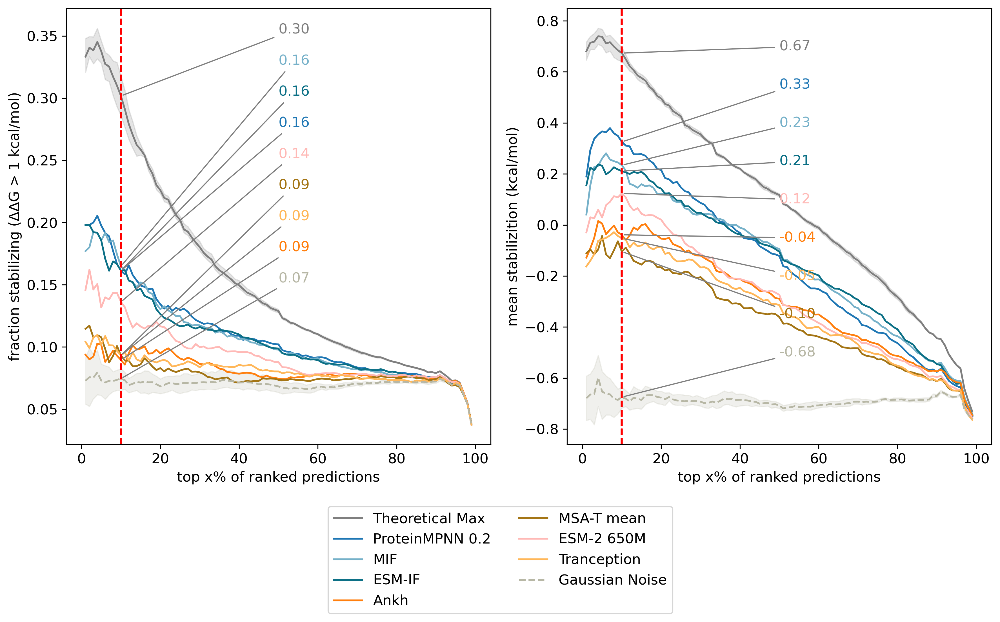

In [16]:
fig = analysis_utils.recovery_curves(crn, ['upper_bound_dir', 'mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_weights_dir', 'random_dir'], left_spacing=(0.05), left_text_offset=(40, 0.05), right_spacing=0.05, right_text_offset=(40, 0.01), measurements=['ddG'], plots=['auppc', 'aumsc'], title='')
#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'supp_fig6.png'), bbox_inches='tight')

### Supplementary Table 5

In [17]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=10, quiet=True)
tmp2 = summ2.reset_index()

# ~ 1.5 minutes for 10 bootstraps

upper_bound
korpm
stability-oracle
random
mpnn_20_00
esm2_650M
cartesian_ddg
mpnn_rosetta


MSE Accuracy Spearman's ρ     wρ  \
Model Type  Model                                                             
unknown     ΔΔG label              0.00 ± 0.00     1.00         1.00   1.00   
            Theoretical Max        0.98 ± 0.03     0.78         0.78   0.68   
ensemble    Ensemble 8 Feats       1.55 ± 0.30     0.73         0.66   0.49   
            Ensemble 6 Feats       1.56 ± 0.30     0.73         0.66   0.49   
            Ensemble 5 Feats       1.56 ± 0.30     0.73         0.66   0.49   
            Ensemble 7 Feats       1.57 ± 0.31     0.73         0.66   0.49   
            Ensemble 4 Feats       1.62 ± 0.31     0.72         0.65   0.50   
potential   KORPM                  1.73 ± 0.29     0.71         0.56   0.44   
ensemble    Ensemble 3 Feats       1.74 ± 0.34     0.73         0.60   0.41   
transfer    Stability Oracle       1.81 ± 0.39     0.71         0.63   0.50   
ensemble    Ensemble 2 Feats       2.02 ± 0.41     0.69         0.52   0.37   
struc. PSLM ESM-IF                 3.07 ± 0.74     0.65         0.37   0.43   
seq. PSLM   Tranception (reduced)  3.15 ± 0.74     0.61         0.32   0.25   
            Tranception            3.15 ± 0.74     0.61         0.33   0.25   
unknown     Gaussian Noise         3.71 ± 0.47     0.55         0.01  -0.02   
struc. PSLM ProteinMPNN 0.3        7.65 ± 1.34     0.66         0.46   0.45   
            ProteinMPNN 0.2        8.18 ± 1.44     0.67         0.46   0.44   
            ProteinMPNN 0.1        8.75 ± 1.38     0.66         0.46   0.43   
seq. PSLM   ESM-2 150M             23.6 ± 5.05     0.62         0.21   0.27   
            ESM-1V mean            27.5 ± 3.72     0.62         0.23   0.26   
            ESM-1V median          27.5 ± 3.70     0.62         0.23   0.25   
            ESM-2 650M             31.2 ± 4.04     0.63         0.30   0.30   
            MSA-T mean             32.1 ± 5.00     0.63         0.36   0.24   
            MSA-T median           32.1 ± 4.96     0.62         0.35   0.25   
struc. PSLM MIF                    32.7 ± 5.72     0.65         0.46   0.45   
biophysical Rosetta CartDDG        33.8 ± 2.92     0.70         0.63   0.47   
struc. PSLM MIF-ST                 36.0 ± 2.59     0.64         0.45   0.38   
seq. PSLM   Ankh                   39.1 ± 3.56     0.63         0.36   0.23   
            ESM-2 3B               41.6 ± 3.93     0.62         0.31   0.28   
            ESM-2 15B              47.9 ± 3.86     0.62         0.35   0.27   
struc. PSLM Rosetta/ProtMPNN       69.2 ± 5.70     0.69         0.66   0.53   
NaN         Avg. Dev.                    2.15      0.04         0.04   0.03   

                                   NDCG wNDCG  
Model Type  Model                              
unknown     ΔΔG label              1.00  1.00  
            Theoretical Max        0.89  0.83  
ensemble    Ensemble 8 Feats       0.81  0.74  
            Ensemble 6 Feats       0.82  0.74  
            Ensemble 5 Feats       0.82  0.74  
            Ensemble 7 Feats       0.82  0.74  
            Ensemble 4 Feats       0.83  0.74  
potential   KORPM                  0.78  0.74  
ensemble    Ensemble 3 Feats       0.81  0.73  
transfer    Stability Oracle       0.79  0.75  
ensemble    Ensemble 2 Feats       0.80  0.70  
struc. PSLM ESM-IF                 0.77  0.72  
seq. PSLM   Tranception (reduced)  0.71  0.67  
            Tranception            0.72  0.67  
unknown     Gaussian Noise         0.68  0.59  
struc. PSLM ProteinMPNN 0.3        0.81  0.75  
            ProteinMPNN 0.2        0.79  0.73  
            ProteinMPNN 0.1        0.80  0.75  
seq. PSLM   ESM-2 150M             0.76  0.67  
            ESM-1V mean            0.75  0.67  
            ESM-1V median          0.75  0.67  
            ESM-2 650M             0.75  0.69  
            MSA-T mean             0.74  0.67  
            MSA-T median           0.73  0.67  
struc. PSLM MIF                    0.77  0.70  
biophysical Rosetta CartDDG        0.81  0.74  
struc. PSLM 

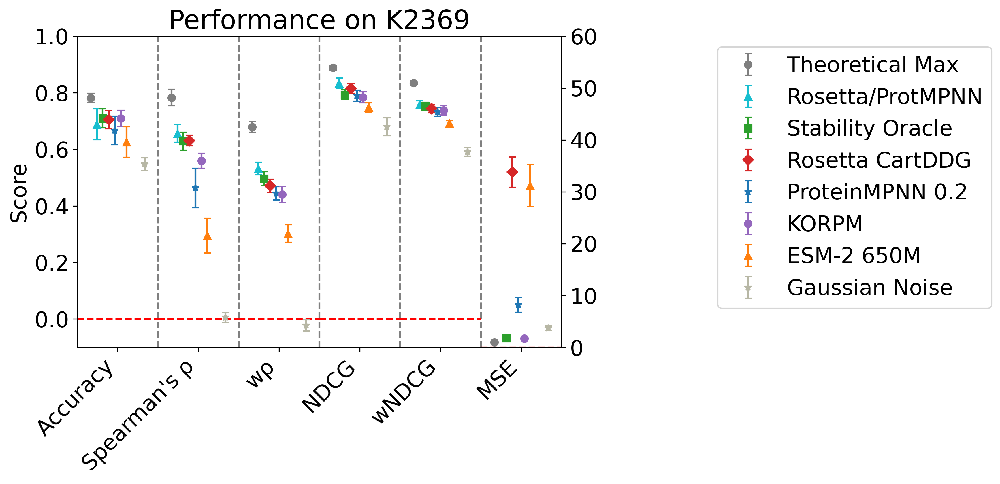

In [18]:
ss2 = tmp2.sort_values('mean_squared_error_mean', ascending=False).dropna(how='all', axis=1).reset_index()
ss3 = ss2.loc[ss2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'upper_bound_dir',
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'K1566_pslm_rfa_8_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)
plot_cols = ['accuracy', 'spearman', 'weighted_spearman', 'ndcg', 'weighted_ndcg', 'mean_squared_error']
plot_models = ['upper_bound', 'mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'K2369'
y_lim = (-0.1, 1)
right_y_lim = (0, 60)
table_cols = ['mean_squared_error', 'accuracy', 'spearman', 'weighted_spearman', 'ndcg', 'weighted_ndcg']
tab, fig = analysis_utils.bootstrap_table(ss3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['mean_squared_error'],
                sort_col='mean_squared_error',
                sort_order='ascending',
                #saveloc_formatted='../data/extended/k2369_bootstrapped_formatted_extra.csv'
                )

tab
#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'test3.svg'), bbox_inches='tight')

### Correlation between predictions and scores of two selected models
##### Version with Q3421 is used in text. Feel free the change which models are compared

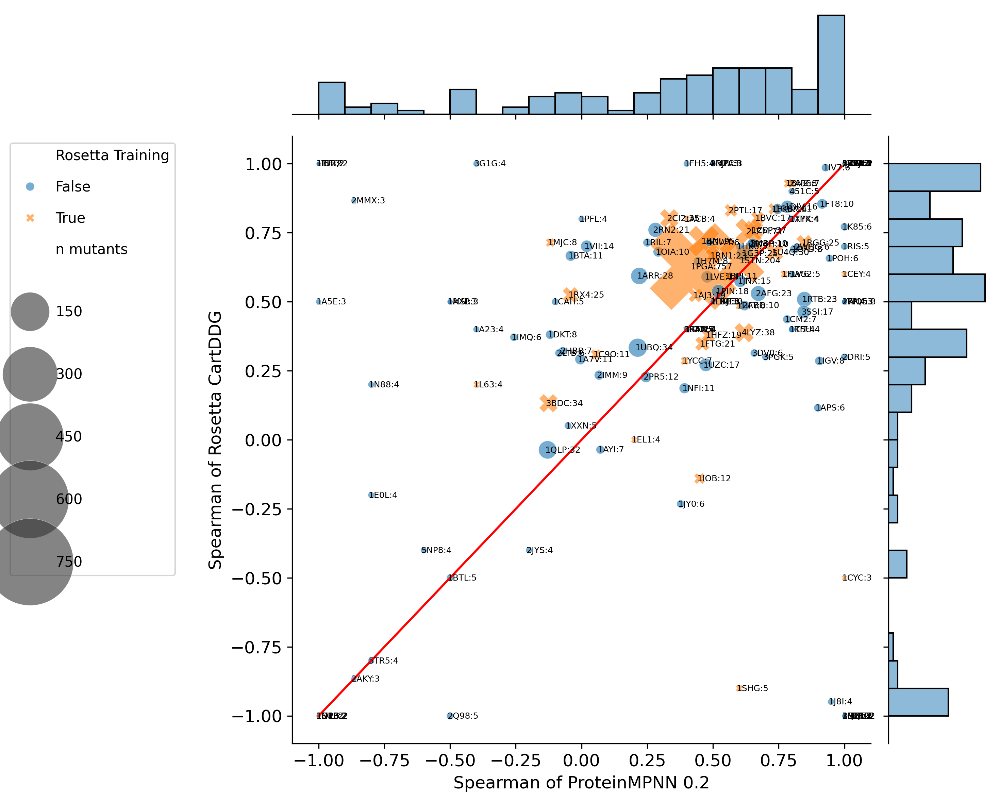

In [19]:
col = 'Rosetta Training'
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2[col] = db['overlaps_seq_rosetta']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
_, g = analysis_utils.correlations(db_class_2, None, stat='spearman', marker_name=col,
    score_name='cartesian_ddg_dir', score_name_2='mpnn_20_00_dir', min_obs=1, group=True, plot=True, out=True, runtime=False)
#g.fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'test2.svg'))

##### The following cells are for Figure 5. We compiled several figures together

In [20]:
# choose which models are used for the feature based analyses

subset = ['K1566_pslm_rfa_6_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'upper_bound_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_weights_dir',
            'esm2_650M_dir',
            #'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_rosetta_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            #'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

### Figure 5a (only top part is used)

  0%|          | 0/10 [00:00<?, ?it/s]

['ΔΔG <= -1.5', '0 >= ΔΔG > -1.5', 'ΔΔG > 0']
class
0 >= ΔΔG > -1.5    493
ΔΔG <= -1.5        367
ΔΔG > 0            581
Name: n, dtype: int64


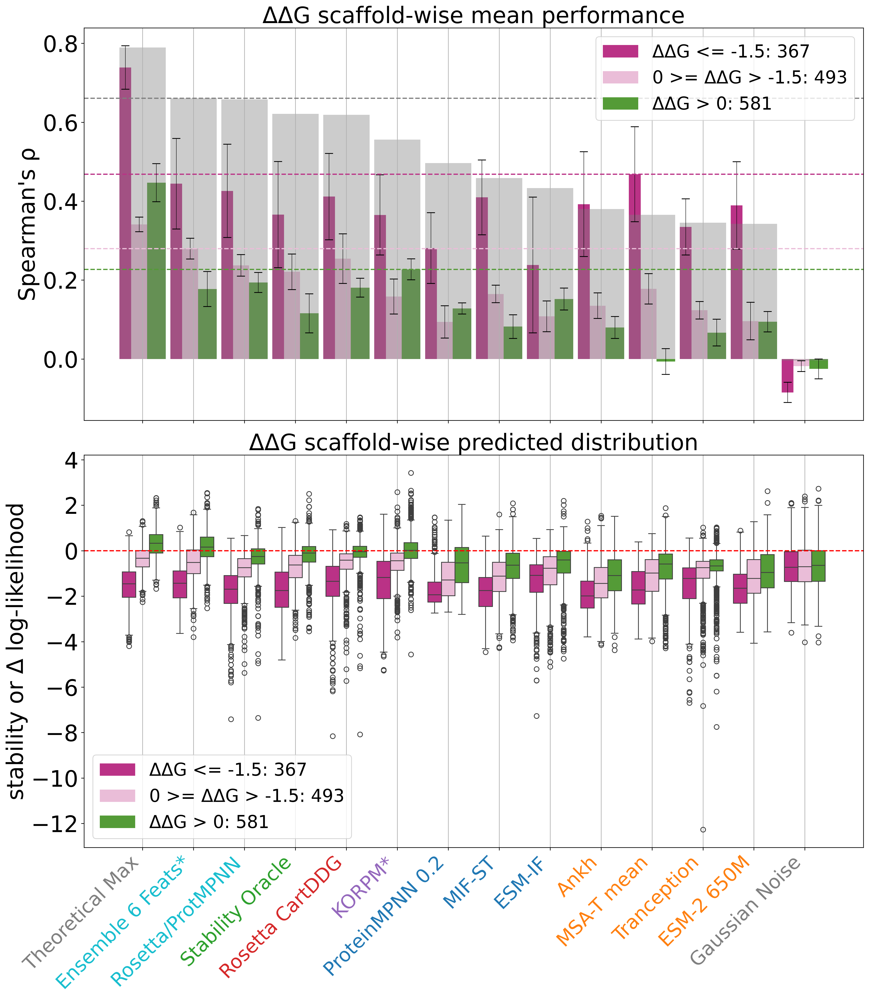

In [21]:
db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)
d, model_order, fig = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 10,
                        #count_muts = True,
                        subset = subset,
                        grouper = 'cluster',
                        plots = 'both',
                        drop_label = True,
                        asterisk = ('KORPM', 'Ensemble 6 Feats'),
                        #double_asterisk = ('Stability Oracle',),
                        legend_loc = 'upper right',
                        #saveloc_perf = os.path.join(path, 'data', 'extended', 'figure_data', 'fig5a.csv'),
                        #saveloc_dist = os.path.join(path, 'data', 'extended', 'figure_data', 'fig5a_extra.csv')
                        )

#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'fig5a.svg'), bbox_inches='tight')

### Figure 5b (only top half is used)

  0%|          | 0/10 [00:00<?, ?it/s]

['neff <= 70 & conservation <= 70', 'neff > 70 & conservation <= 70', 'conservation > 70']
neff <= 70 & conservation <= 70% : 544
neff > 70 & conservation <= 70% : 772
conservation > 70% : 195
class
conservation > 70                  195
neff <= 70 & conservation <= 70    544
neff > 70 & conservation <= 70     772
Name: n, dtype: int64


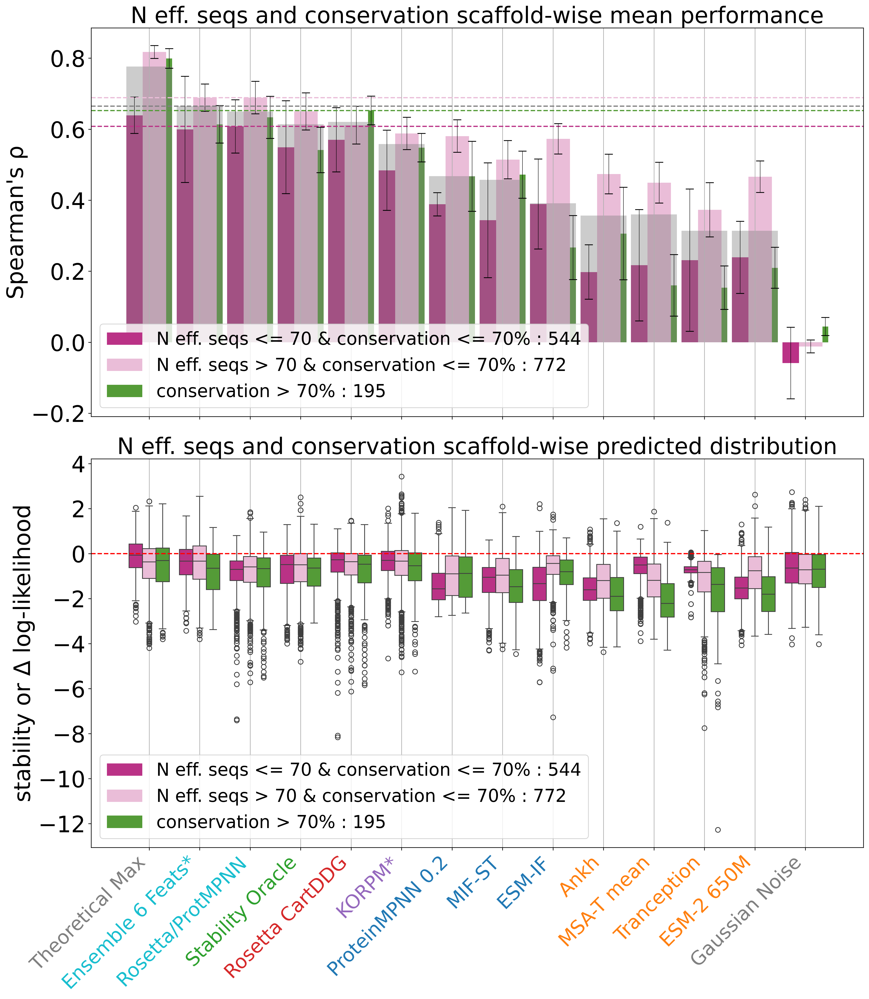

In [22]:
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d, models, fig = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        split_col_2 = 'conservation', 
                        threshold_1 = 70,
                        threshold_2 = 70, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 10,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        order=model_order,
                        plots='both',
                        drop_label = True,
                        asterisk=('KORPM', 'Ensemble 6 Feats'),
                        #double_asterisk=('Stability Oracle',),
                        split_last=False,
                        legend_loc='lower left',
                        #saveloc_perf = os.path.join(path, 'data', 'extended', 'figure_data', 'fig5b.csv'),
                        #saveloc_dist = os.path.join(path, 'data', 'extended', 'figure_data', 'fig5b_extra.csv')
                        )

#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'fig5b.svg'), bbox_inches='tight')

### Figure 5 c&d

  0%|          | 0/10 [00:00<?, ?it/s]

['rel_ASA <= 0.2 & delta_kdh <= 0', 'rel_ASA <= 0.2 & delta_kdh > 0', 'rel_ASA > 0.2 & delta_kdh <= 0', 'rel_ASA > 0.2 & delta_kdh > 0']
class
rel_ASA <= 0.2 & delta_kdh <= 0    331
rel_ASA <= 0.2 & delta_kdh > 0     212
rel_ASA > 0.2 & delta_kdh <= 0     515
rel_ASA > 0.2 & delta_kdh > 0      680
Name: n, dtype: int64


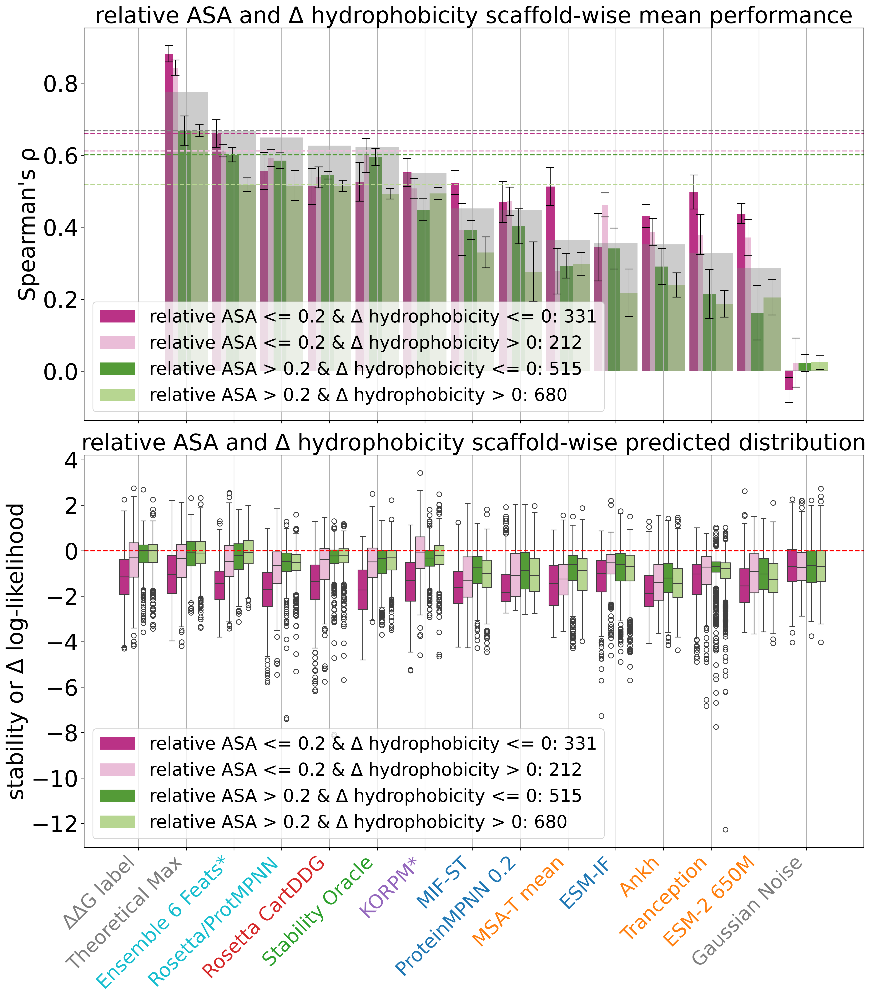

In [23]:
current_feats = ['delta_kdh_dir', 'rel_ASA_dir', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)

#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d, models, fig = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'rel_ASA',  
                        split_col_2 = 'delta_kdh',
                        threshold_1 = 0.2, 
                        threshold_2 = 0, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=10,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        #order=model_order,
                        drop_label=False,
                        asterisk=('KORPM', 'Ensemble 6 Feats'),
                        #double_asterisk=('Stability Oracle',),
                        legend_loc='lower left',
                        #saveloc_perf = os.path.join(path, 'data', 'extended', 'figure_data', 'fig5c.csv'),
                        #saveloc_dist = os.path.join(path, 'data', 'extended', 'figure_data', 'fig5d.csv')
                        )

#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'fig5cd.svg'), bbox_inches='tight')

##### Next cells are for generating the pairwise ensembles used in the model complementarity section (related to Figure 3a&b)
##### Note that these are not featured in the text

In [24]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]

dfm = db[models + ['cluster', 'ddG']] #db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0
dfr['runtime_mutcomputex_dir'] = np.nan
dfr['runtime_stability-oracle_dir'] = np.nan

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))
#dfm

def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ
    
# < 10 seconds

concatenating
joining...


##### Pairwise statistics for all model combinations (data/pairwise)

In [25]:
# compute all statistics on the combined set (already done, takes ~12 hours, uncomment if desired)
#d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'pairwise', 'pairwise_k2369_combinations_3_weights.csv'), overwrite=True)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_k2369_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

auroc  \
model_type  model                                          class             
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN    0.814645   
biophysical stability-oracle_dir + cartesian_ddg_dir * 1   NaN    0.835325   
            cartesian_ddg_dir + stability-oracle_dir * 1   NaN    0.835325   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.815412   
            cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.833256   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5       NaN    0.814331   
            stability-oracle_dir + cartesian_ddg_dir * 0.5 NaN    0.830500   
transfer    stability-oracle_dir + mpnn_20_00_dir * 0.5    NaN    0.813884   
            stability-oracle_dir + mpnn_10_00_dir * 1      NaN    0.801232   
            mpnn_10_00_dir + stability-oracle_dir * 1      NaN    0.801232   
biophysical cartesian_ddg_dir + mpnn_30_00_dir * 0.5       NaN    0.812132   
            mpnn_30_00_dir + cartesian_ddg_dir * 1         NaN    0.793036   
            cartesian_ddg_dir + mpnn_30_00_dir * 1         NaN    0.793036   
            cartesian_ddg_dir + mif_dir * 0.5              NaN    0.805764   
potential   stability-oracle_dir + korpm_dir * 0.5         NaN    0.828765   
biophysical mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN    0.797285   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         NaN    0.797285   
transfer    mpnn_20_00_dir + stability-oracle_dir * 1      NaN    0.800298   
            stability-oracle_dir + mpnn_20_00_dir * 1      NaN    0.800298   
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.2       NaN    0.820452   

                                                                     auprc  \
model_type  model                                          class             
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN    0.740864   
biophysical stability-oracle_dir + cartesian_ddg_dir * 1   NaN    0.766897   
            cartesian_ddg_dir + stability-oracle_dir * 1   NaN    0.766897   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.746187   
            cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.759340   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5       NaN    0.742796   
            stability-oracle_dir + cartesian_ddg_dir * 0.5 NaN    0.762024   
transfer    stability-oracle_dir + mpnn_20_00_dir * 0.5    NaN    0.740474   
            stability-oracle_dir + mpnn_10_00_dir * 1      NaN    0.724521   
            mpnn_10_00_dir + stability-oracle_dir * 1      NaN    0.724521   
biophysical cartesian_ddg_dir + mpnn_30_00_dir * 0.5       NaN    0.737459   
            mpnn_30_00_dir + cartesian_ddg_dir * 1         NaN    0.717287   
            cartesian_ddg_dir + mpnn_30_00_dir * 1         NaN    0.717287   
            cartesian_ddg_dir + mif_dir * 0.5              NaN    0.732064   
potential   stability-oracle_dir + korpm_dir * 0.5         NaN    0.754340   
biophysical mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN    0.727101   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         NaN    0.727101   
transfer    mpnn_20_00_dir + stability-oracle_dir * 1      NaN    0.724974   
            stability-oracle_dir + mpnn_20_00_dir * 1      NaN    0.724974   
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.2       NaN    0.741880   

                                                                  0.0_n_stable  \
model_type  model                                          class                 
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN           990.0   
biophysical stability-oracle_dir + cartesian_ddg_dir * 1   NaN           990.0   
            cartesian_ddg_dir + stability-oracle_dir * 1   NaN           990.0   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN           991.0   
            cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN           990.0   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5       Na

### Complement for Figure 3a&b (except on K2369 dataset)

2369


  0%|          | 0/100 [00:00<?, ?it/s]

0.06922101728263808
['Rosetta CartDDG', 'Stability Oracle', 'KORPM', 'ProteinMPNN 0.2', 'MIF', 'MIF-ST', 'ESM-IF', 'Ankh', 'MSA-T mean', 'Tranception', 'ESM-2 650M', 'ESM-1V mean']


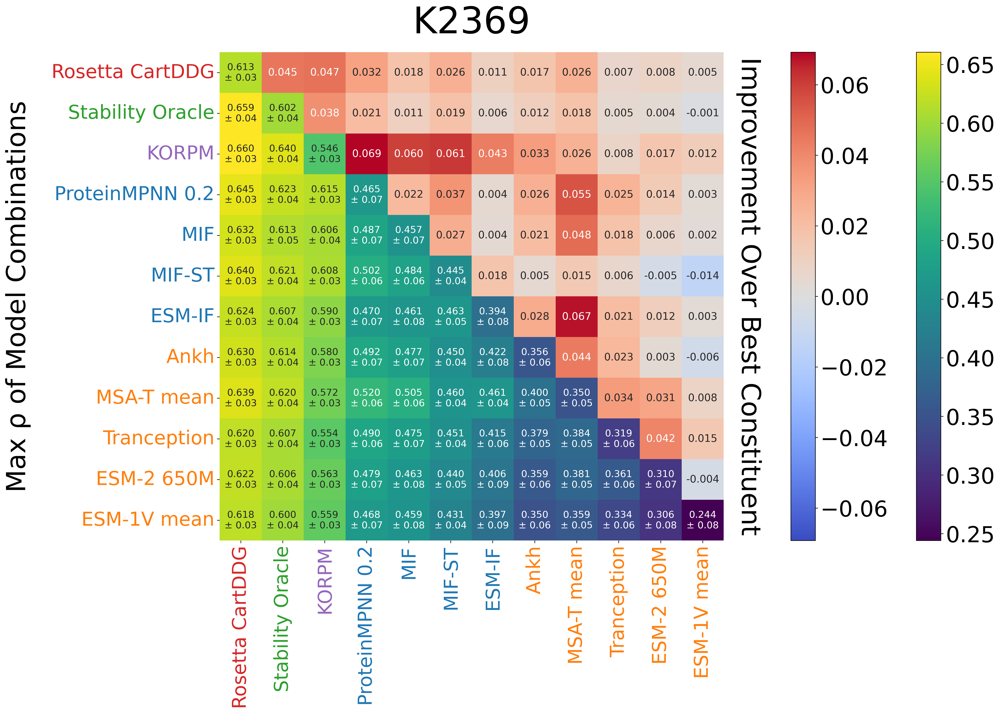

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,korpm_dir,0.5,0.660461,0.0
2,cartesian_ddg_dir,1,stability-oracle_dir,1,0.658926,0.0
3,cartesian_ddg_dir,1,stability-oracle_dir,0.5,0.65629,0.0
4,korpm_dir,1,cartesian_ddg_dir,1,0.655077,0.0
5,stability-oracle_dir,1,cartesian_ddg_dir,0.5,0.648886,0.0


In [26]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_weights_dir',
            'ankh_dir',
            'esm2_650M_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df, fig = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=100, upper=upper, subset=subset2, title='K2369')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df.head()

### Complement for Extended Data Figurse 3&4 (except on K2369 dataset)

2369


  0%|          | 0/100 [00:00<?, ?it/s]

60.49098000000001
['Rosetta CartDDG', 'Stability Oracle', 'KORPM', 'ProteinMPNN 0.2', 'MIF-ST', 'ESM-IF', 'MIF', 'ESM-2 650M', 'Ankh', 'Tranception', 'MSA-T mean', 'ESM-1V mean']


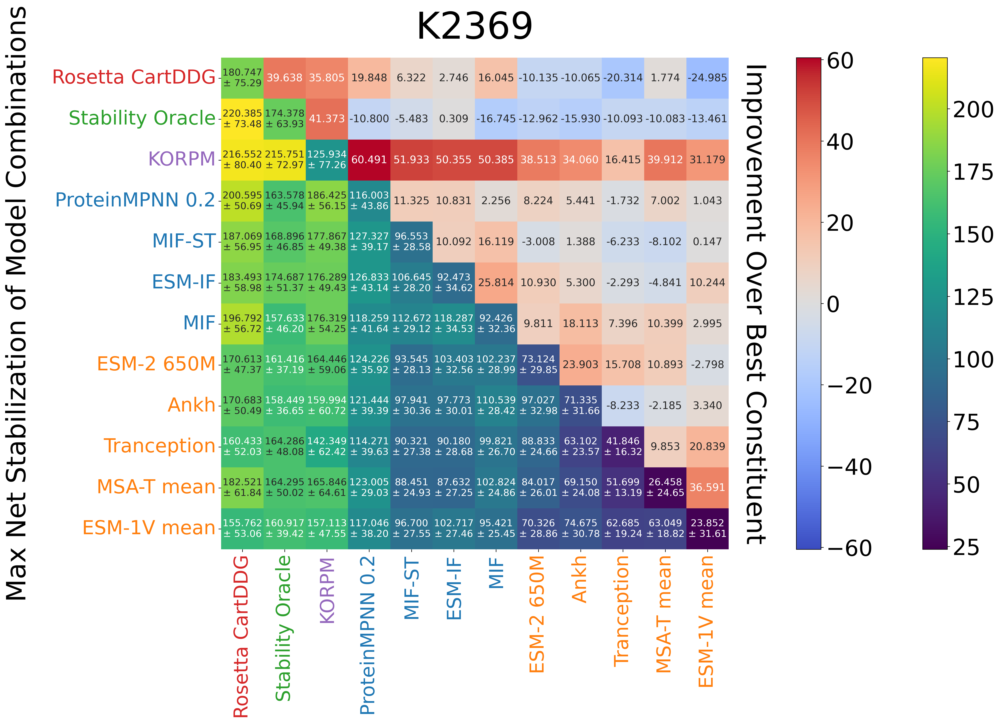

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,stability-oracle_dir,1,cartesian_ddg_dir,1,220.38494,0.0
2,cartesian_ddg_dir,1,stability-oracle_dir,0.5,220.02982,0.0
3,cartesian_ddg_dir,1,korpm_dir,0.5,216.5521,0.0
4,stability-oracle_dir,1,korpm_dir,0.5,215.75132,0.0
5,korpm_dir,1,stability-oracle_dir,0.5,212.26002,0.0


In [27]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df, fig = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=100, upper=upper, subset=subset2, title='K2369')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df.head()

# ~ 10 seconds

### Supplementary Figure 3

[ 5.59485531e-01  5.00000000e-01  4.67018470e-01  0.00000000e+00
 -9.03538256e-06  0.00000000e+00 -5.43614752e-04]


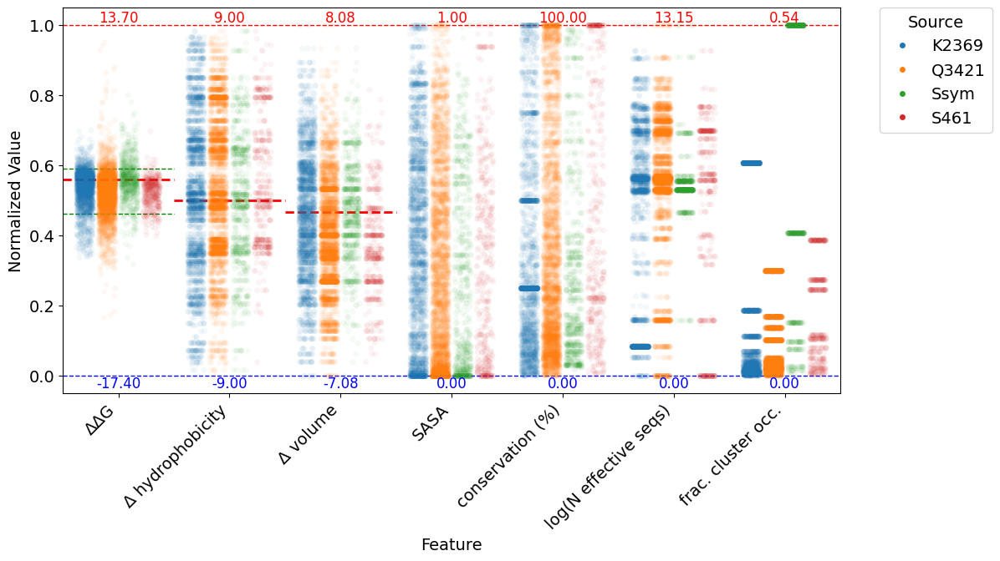

In [31]:
#db = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv'))
s461_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))
ssym_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))
ssym_feats = ssym_feats.rename({'delta_kdh':'delta_kdh_dir', 'delta_vol':'delta_vol_dir', 'rel_ASA':'rel_ASA_dir'}, axis=1)
q3421_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv'))

#compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])
fig = analysis_utils.compare_distributions_boxes([db,q3421_feats,ssym_feats,s461_feats], shared_columns=['ddG', 'delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff'], sources=['K2369', 'Q3421', 'Ssym', 'S461'])
#analysis_utils.compare_distributions_violin(db, korpm_feats, shared_columns=['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff', 'ddG'], source1='Q3421', label_adjust=0.25)
#fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'supp_fig3.png'), bbox_inches='tight')

### Complement for Supplementary Figure 4 (except on K2369 dataset)

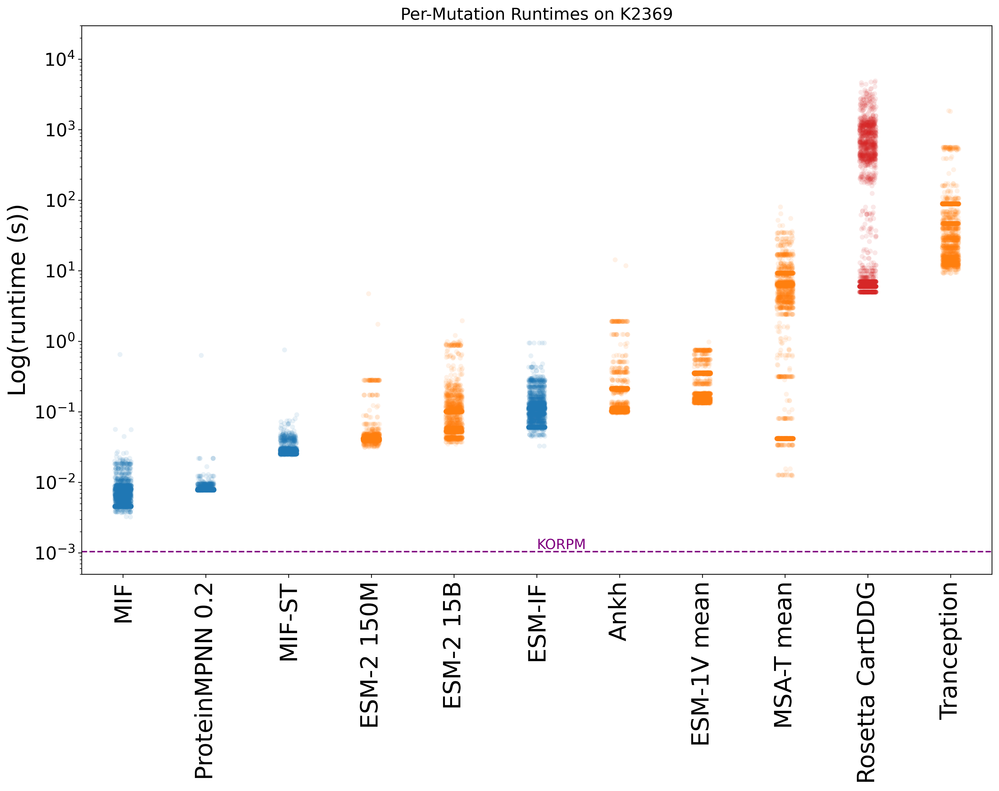

In [32]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_weights_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir',
                             'runtime_korpm_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])
korpm_time = total_runtimes.loc[total_runtimes['variable']=='korpm', 'value'].mean()
total_runtimes = total_runtimes.loc[total_runtimes['variable']!='korpm']

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=korpm_time, color='purple', linestyle='--', label='KORPM')
plt.text(5, korpm_time, 'KORPM', color='purple', verticalalignment='bottom')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on K2369')
plt.yscale('log')
plt.ylim(0.0005, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()